## <center> Bài tập Biến hình và Xử lý ảnh </center>

Họ và Tên: Huỳnh Nguyễn Thế Dân

MSSV: 21110256

Lớp: 21TTH1

In [50]:
import os
def ConnectToDataFolder(FolderPath):
  print("=" * 80, "- Begin: ConnectToDataFolder")
  
  if (os.path.isdir(FolderPath)):
    os.chdir(FolderPath)
    print("List of Data in the Folder :")
    display(os.listdir())
  else:
    print(f"{FolderPath} is not correct, please check the folder again")
  
  print("=" * 80, "- Finish: ConnectToDataFolder")

In [51]:
def GetSubFiles(dir, ExtensionList = []):
    print("=" * 80, "- Begin: GetSubFiles")

    "Get a list of immediate subfiles"
    all_names = next(os.walk(dir))[2]
    subfile_names = []
    if(len(ExtensionList) > 0):
      for filename in all_names:
        fname, fextension = os.path.splitext(filename)
        if any(ext in fextension for ext in ExtensionList):
          subfile_names.append(dir + "/" + filename)
    else:
      subfile_names = [dir + "/" + x for x in all_names]
    
    print(f"There are {len(subfile_names)} files are found")
    subfile_names.sort()
    print("Here is some samples :")
    [print(x) for x in subfile_names[0: min(len(subfile_names), 5)]]

    print("=" * 80, "- End: GetSubFiles")
    return subfile_names

In [52]:
from matplotlib import pyplot as plt 
import matplotlib.gridspec as gridspec

def ShowImage(ImageList, nRows = 1, nCols = 2, ImageTitleList = []):    
    gs = gridspec.GridSpec(nRows, nCols)     
    plt.figure(figsize=(20,20))
    for i in range(len(ImageList)):
        ax = plt.subplot(gs[i])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')

        plt.subplot(nRows, nCols, i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        if(len(ImageTitleList)  > 0):
          plt.title("Image " + str(ImageTitleList[i]))
        else:
          plt.title("Image " + str(i))

        plt.axis('off')

    plt.show()

In [53]:
import random
from pylab import imread

def ShowRandomImage(DatasetFiles, nRows = 1, nCols = 5, seedNo = 10):
    print("=" * 80, "- Begin: ShowRandomImage")

    nFile = nRows * nCols

    random.seed(seedNo)
    FileNameList = random.sample(DatasetFiles, nFile)
    ImageList = []
    for filepath in FileNameList:
        image_RGB = imread(filepath)
        ImageList.append(image_RGB)
    
    ShowImage(ImageList, nRows, nCols, FileNameList)

    print("=" * 80, "- Finish: ShowRandomImage")
    return FileNameList, ImageList

In [54]:
from skimage.transform import rescale, resize
import cv2 
 
def ResizeImage(image, wresize = 0, hresize = 0):
    OrigWidth, OrigHeight = float(image.shape[1]), float(image.shape[0])

    if((wresize == 0) & (hresize == 0)):
        return image
    if(wresize == 0):
        wresize = int((OrigWidth * hresize)/OrigHeight)
    if(hresize == 0):
        hresize = int((OrigHeight * wresize)/OrigWidth)
    resize_image = cv2.resize(image, (wresize, hresize), interpolation = cv2.INTER_NEAREST) 
    return resize_image

In [55]:
def ConvertColorSpaces(image, ColorSpace = "GRAY", display = 1):
  ImageTitleList = ["RGB", ColorSpace]

  if(ColorSpace.upper() == "HSV"):
    image_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    ChannelList = ["Chrominance Hue" , "Chrominance Saturation", "Luminance Value"]
  elif(ColorSpace.upper() == "YCRCB"):
    image_convert = cv2.cvtColor(image, cv2.COLOR_BGR2YCR_CB)
    ChannelList = ["Chrominance Red" , "Chrominance Blue", "Luminance Y"]
  elif(ColorSpace.upper() == "LAB"):
    image_convert = cv2.cvtColor(image, cv2.COLOR_RGB2YCR_CB)
    ChannelList = ["Chrominance a(Green To Red)" , "Chrominance b(Blue To Yellow)", "Luminance L"]
  else:
    image_convert = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

  if(display):
    if(len(image_convert.shape) == 3):  
      ShowImage([image, image_convert, image_convert[:,:,0], image_convert[:,:,1], image_convert[:,:,2]], 1, 5, 
                ImageTitleList + ChannelList)
    else:
      ShowImage([image, image_convert], 1, 5, ImageTitleList)

  return image_convert

In [56]:
import matplotlib.pyplot as plt
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

def ShowHistogram(image, Title = "Color Histogram", ChannelList = ["Channel 1", "Channel 2", "Channel 3"]):
  fig, ax = plt.subplots(figsize=(20, 10))

  if(len(image.shape) == 3):
    color = ('r', 'g', 'b')
    for channel,col in enumerate(color):
        histr = cv2.calcHist([image],[channel],None,[256],[0,256])
        ax.plot(histr,color = col, label = ChannelList[channel])
        
    plt.title(Title)
    plt.legend()
  else:
    histr = cv2.calcHist([image],[0],None,[256],[0,256])
    plt.plot(histr,color = "gray", label = "Gray")
    plt.title("Gray Histogram")
    plt.legend()

  # Set axis ranges; by default this will put major ticks every 25.
  ax.set_xlim(0, 255)

  # Change major ticks to show every 20.
  ax.xaxis.set_major_locator(MultipleLocator(20))

  # Change minor ticks to show every 5. (20/4 = 5)
  ax.xaxis.set_minor_locator(AutoMinorLocator(4))

  # Turn grid on for both major and minor ticks and style minor slightly
  # differently.
  ax.grid(which='major', color='#CCCCCC', linestyle='--')
  ax.grid(which='minor', color='#CCCCCC', linestyle=':')
  plt.show()

In [57]:
import numpy as np

def SegmentByThresh(image, channel, segment_range = [], display = 1):
  if(len(segment_range) == 0):
    thresh, image_mask = cv2.threshold(channel,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    print(f"Otsu Threshold : {thresh}")
  else:
    image_mask = ((channel > segment_range[0]) & (channel < segment_range[1]))

  image_segment = cv2.bitwise_and(image, image, mask = image_mask.astype(np.uint8))

  ImageTitleList = ["Color Image", "Segmented Channel", "Segmented Mask", "Segmented Color Image"]
  if(display):
    ShowImage([image, channel, image_mask, image_segment], 1, 5, ImageTitleList)

  image_mask = image_mask.astype(bool)
  return image_mask

In [58]:
import skimage
from skimage import measure

def GetLargestBinaryArea(image, image_mask, display = 1):
  labels_mask = measure.label(image_mask)                       
  regions = measure.regionprops(labels_mask)
  regions.sort(key=lambda x: x.area, reverse=True)
  if len(regions) > 1:
      for rg in regions[1:]:
          labels_mask[rg.coords[:,0], rg.coords[:,1]] = 0
  labels_mask[labels_mask!=0] = 1
  image_mask = labels_mask
  
  image_segment = cv2.bitwise_and(image, image, mask = image_mask.astype(np.uint8))
  ImageTitleList = ["Color Image", "Segmented Mask", "Segmented Color Image"]
  
  if(display):
    ShowImage([image, image_mask, image_segment], 1, 5, ImageTitleList)

  return image_mask

In [59]:
from skimage.measure import label, regionprops
from skimage.segmentation import mark_boundaries

def LabelObjectByMask(image_input, image_mask, type = "BBox", color = (0,255,0)):
    image_output = image_input.copy()

    Marker_Size = int(AnImage.shape[0] * 0.1)
    Marker_Thick = int(AnImage.shape[0] * 0.01)
    BBoxThick = int(AnImage.shape[0] * 0.01)
    ContourThick = int(AnImage.shape[0] * 0.01)

    label_img = label(image_mask)
    regions = regionprops(label_img)
    for props in regions:
        minr, minc, maxr, maxc = props.bbox
        left_top = (minc, minr)
        right_bottom = (maxc, maxr)
        at_row, at_col = props.centroid

        if(type == "BBox"):
          cv2.rectangle(image_output,left_top, right_bottom, color ,BBoxThick)

        if(type == "Boundary"):
          contours, heirarchy = cv2.findContours(image_mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
          cv2.drawContours(image_output, contours, -1, color, ContourThick)
          cv2.drawMarker(image_output, (int(at_col), int(at_row)),color, markerType=cv2.MARKER_STAR, 
                           markerSize= Marker_Size, thickness= Marker_Thick, line_type=cv2.LINE_AA)
          
        if(type == "Fill"):
          image_output[image_mask > 0] = color
            
    return image_output

In [60]:
def IntensityTransformation(image, gamma = 0.3, display = 1):
  image_gamma_corrected = np.array(255*(image / 255) ** gamma, dtype = 'uint8')
  ShowImage([image, image_gamma_corrected], 1, 5, ["Original Image", f"Gamma = {gamma}"])
  if(display):
    GammaImageList = []
    TitleList = []
  
    for g in [0.3, 0.5, 0.9, 1.2, 2.2]:
      # Apply gamma correction.
      gamma_corrected = np.array(255*(image / 255) ** g, dtype = 'uint8')
      GammaImageList.append(gamma_corrected)
      TitleList.append(f"Gamma = {g}")

    ShowImage(GammaImageList, 1, 5, TitleList)
  return image_gamma_corrected

In [61]:
from skimage.morphology import (erosion, dilation, opening, closing, white_tophat)
from skimage.morphology import black_tophat, skeletonize, convex_hull_image  
from skimage.morphology import disk
from scipy import ndimage

# Morphology 
def Morphology(image, image_mask, morType = "erosion", size = 3, display = 1):
  image_mask = image_mask.astype(np.uint8)
  kernel = disk(abs(size))

  if(morType == "erosion"):
    result = erosion(image_mask, kernel)
  if(morType == "dilation"):
    result = dilation(image_mask, kernel)
  if(morType == "opening"):
    result = opening(image_mask, kernel)
  if(morType == "closing"):
    result = closing(image_mask, kernel)
  if(morType == "gradient"):
    result = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)
  if(morType == "tophat"):
    result = white_tophat(image_mask, kernel)
  if(morType == "blackhat"):
    result = black_tophat(image_mask, kernel)
  if(morType == "fillhole"):
    result = ndimage.binary_fill_holes(image_mask).astype(int)
  if(morType == "skeleton"):
    result = skeletonize(image_mask == 1)
  if(morType == "convexhull"):
    result = convex_hull_image(image_mask == 1)

  if(display):
    image_mask_color = cv2.bitwise_and(image, image, mask = result.astype(np.uint8))

    im_erosion = erosion(image_mask, kernel)
    im_dilation = dilation(image_mask, kernel)
    im_opening = opening(image_mask, kernel)
    im_closing = closing(image_mask, kernel)
    im_gradient = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)
    im_tophat = white_tophat(image_mask, kernel)
    im_blackhat = black_tophat(image_mask, kernel)
    im_fillhole = ndimage.binary_fill_holes(image_mask).astype(int)
    im_skeleton = skeletonize(image_mask == 1)
    im_convexhull = convex_hull_image(image_mask == 1)

    ShowImage([image, result, image_mask_color], 1, 5, ImageTitleList= ["Color Image", "Mask", "Segment By Mask"])
    ShowImage([im_erosion, im_dilation, im_opening, im_closing, im_gradient], 1, 5, 
              ImageTitleList= ["Erosion", "Dilation", "Opening", "Closing", "Gradient"])
    ShowImage([im_tophat, im_blackhat, im_fillhole, im_skeleton, im_convexhull], 1, 5, 
              ImageTitleList= ["Tophat", "BlackHat", "FillHole", "Skeleton", "Convexhull"])
    
  result = result.astype(bool)
  return result

In [62]:
import numpy as np
def ConcatImage(ImageList, CombineType = "h", display = 1):
  if(CombineType == "h"):
    result = np.concatenate(ImageList, axis=1)
  else:
    result = np.concatenate(ImageList, axis=0)
  
  if(display):
    ShowImage([result], 1, 1)

  result = np.uint8(result)
  return result

In [63]:
from pathlib import Path
    
def GenerateOutput(image, image_mask, FilePath = "", SaveFolderPath = ""):
  image_output_rgbmask = cv2.merge([image_mask*255, image_mask*255, image_mask*255])
  image_output_fill = LabelObjectByMask(image, image_mask, type = "Fill", color = (255,0,0))
  image_output_bbox = LabelObjectByMask(image, image_mask, type = "BBox", color = (255,0,0))
  image_output_boundary = LabelObjectByMask(image, image_mask, type = "Boundary", color = (255,0,0))

  DemoImage1 = ConcatImage([image_output_rgbmask, image_output_fill], display= 0)
  DemoImage2 = ConcatImage([image_output_bbox, image_output_boundary], display= 0)
  DemoImage = ConcatImage([DemoImage1, DemoImage2], CombineType = "v", display= 0)

  if(len(FolderPath) > 0):
    filename = Path(FilePath).stem
    print(f"Already Save Results to Folder {SaveFolderPath}")
    
    print(f'{SaveFolderPath}/{filename}_rgbmask.jpg')
    cv2.imwrite(f'{SaveFolderPath}/{filename}_mask.jpg', image_output_rgbmask)

    print(f'{SaveFolderPath}/{filename}_demo.jpg')
    cv2.imwrite(f'{SaveFolderPath}/{filename}_demo.jpg', cv2.cvtColor(DemoImage, cv2.COLOR_RGB2BGR))

  return image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary, DemoImage

In [64]:
def doOrangeMaskSegment(AnImage, image_mask, display = 1):
  MaskList = []
  MaskList.append(image_mask)
  image_mask_adjust = Morphology(AnImage, image_mask, morType = "fillhole", size = 8, display = 0)
  MaskList.append(image_mask_byauto)
  image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "erosion", size = 8, display = 0)
  MaskList.append(image_mask_adjust)
  image_mask_adjust = GetLargestBinaryArea(AnImage, image_mask_adjust, display = 0)
  MaskList.append(image_mask_adjust)
  image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "dilation", size = 10, display = 0)
  MaskList.append(image_mask_adjust)
  
  if(display):
    ShowImage(MaskList, 1, 5)
  
  return image_mask_adjust

In [65]:
def doOrangeMaskSegment2(AnImage, image_mask, display = 1):
  MaskList = []
  MaskList.append(image_mask)
  image_mask_adjust = Morphology(AnImage, image_mask, morType = "fillhole", size = 8, display = 0)
  MaskList.append(image_mask_adjust)
  image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "erosion", size = 50, display = 0)
  MaskList.append(image_mask_adjust)
  image_mask_adjust = GetLargestBinaryArea(AnImage, image_mask_adjust, display = 0)
  MaskList.append(image_mask_adjust)
  image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "dilation", size = 50, display = 0)
  MaskList.append(image_mask_adjust)
  
  if(display):
    ShowImage(MaskList, 1, 5)
  
  return image_mask_adjust

In [66]:
from PIL import Image
import numpy as np

def convert_png_to_jpg(DatasetFiles, path):

    jpg_files = []
    for filepath in DatasetFiles:
        # Mở tệp PNG
        image = Image.open(filepath)

        if image.mode != "RGB":
            image = image.convert("RGB")

        image_array = np.array(image, dtype=np.uint8)
        image = Image.fromarray(image_array)
        output_path = filepath[:-4] + ".jpg"
        image.save(output_path)
        jpg_files.append(output_path)

    return jpg_files

## 1/ Thực hiện các bước để segment đối tượng trái cam fresh và rotten 

### Observations

In [67]:
FolderPath = "/PERSONAL/courses/Bien_hinh_va_Xu_ly_anh/Object-Transformation-and-Segmentation-Applications/lab/Feature_Extraction"
ConnectToDataFolder(FolderPath)

================================================================================ - Begin: ConnectToDataFolder
List of Data in the Folder :


['20110149.ipynb',
 '21110256_HuynhNguyenTheDan_ IS Lab02.ipynb',
 'archive',
 'Orange']

================================================================================ - Finish: ConnectToDataFolder


In [68]:
DatasetFiles = GetSubFiles("Orange", ExtensionList = ["png"])
print(DatasetFiles)

DatasetFiles = convert_png_to_jpg(DatasetFiles, FolderPath)

================================================================================ - Begin: GetSubFiles
There are 40 files are found
Here is some samples :
Orange/FreshOrange01.png
Orange/FreshOrange02.png
Orange/FreshOrange03.png
Orange/FreshOrange04.png
Orange/FreshOrange05.png
================================================================================ - End: GetSubFiles
['Orange/FreshOrange01.png', 'Orange/FreshOrange02.png', 'Orange/FreshOrange03.png', 'Orange/FreshOrange04.png', 'Orange/FreshOrange05.png', 'Orange/FreshOrange06.png', 'Orange/FreshOrange07.png', 'Orange/FreshOrange08.png', 'Orange/FreshOrange09.png', 'Orange/FreshOrange10.png', 'Orange/FreshOrange11.png', 'Orange/FreshOrange12.png', 'Orange/FreshOrange13.png', 'Orange/FreshOrange14.png', 'Orange/FreshOrange15.png', 'Orange/FreshOrange16.png', 'Orange/FreshOrange17.png', 'Orange/FreshOrange18.png', 'Orange/FreshOrange19.png', 'Orange/FreshOrange20.png', 'Orange/RottenOrange01.png', 'Orange/RottenOrange02.png', 'O

================================================================================ - Begin: ShowRandomImage


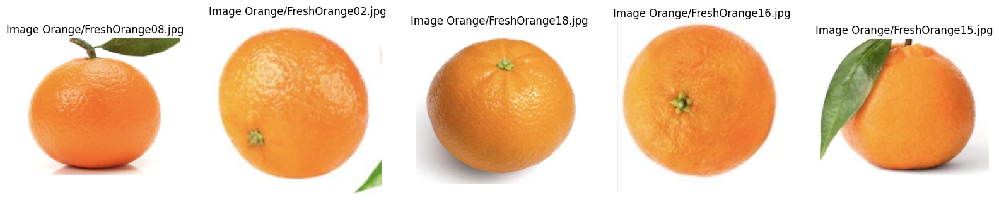

================================================================================ - Finish: ShowRandomImage


In [69]:
FileNameList, ImageList = ShowRandomImage(DatasetFiles, seedNo = 42)

### Segmentation on Specific Image by Hand Craft

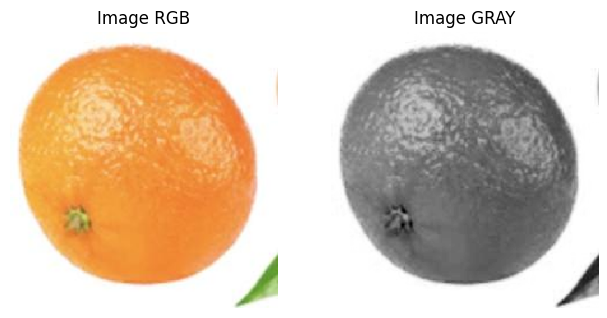

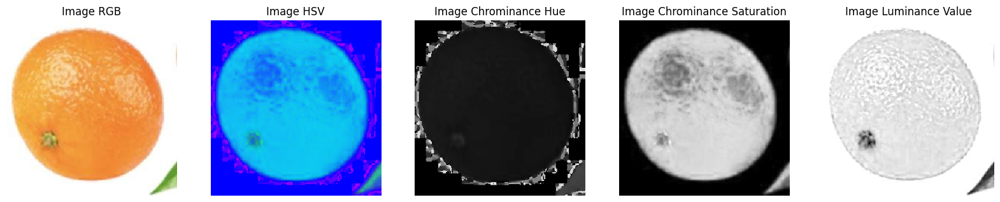

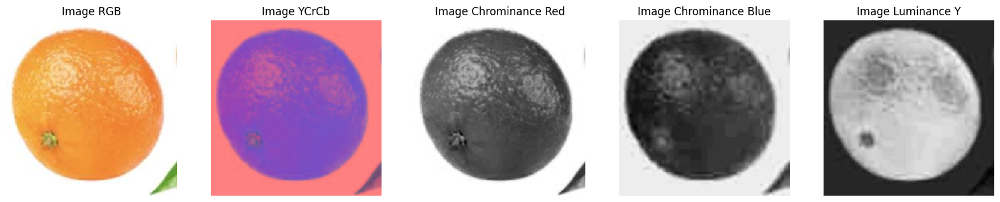

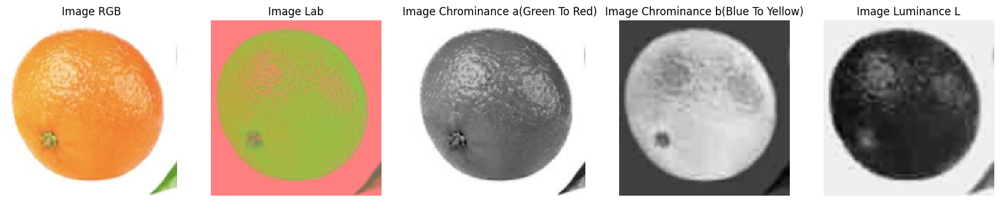

In [70]:
AnImage = ResizeImage(ImageList[1], 0, 300)
image_gray = ConvertColorSpaces(AnImage, ColorSpace = "GRAY")
image_hsv = ConvertColorSpaces(AnImage, ColorSpace = "HSV")
image_ycrcb = ConvertColorSpaces(AnImage, ColorSpace = "YCrCb")
image_lab = ConvertColorSpaces(AnImage, ColorSpace = "Lab")

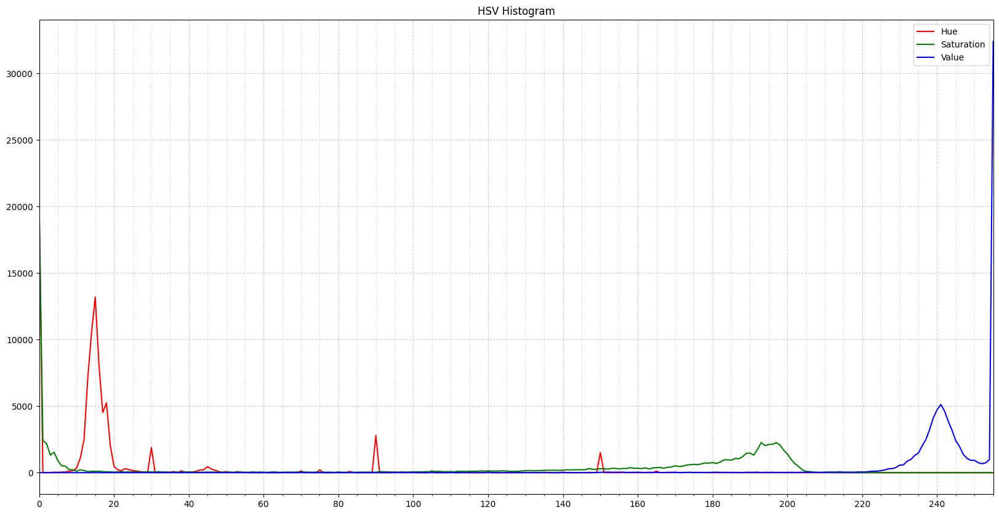

In [71]:
ShowHistogram(image_hsv, Title = "HSV Histogram", ChannelList = ["Hue", "Saturation", "Value"])

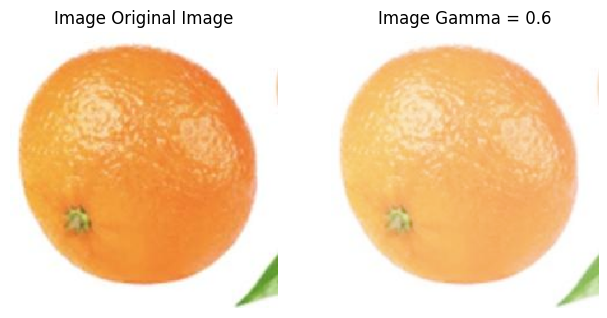

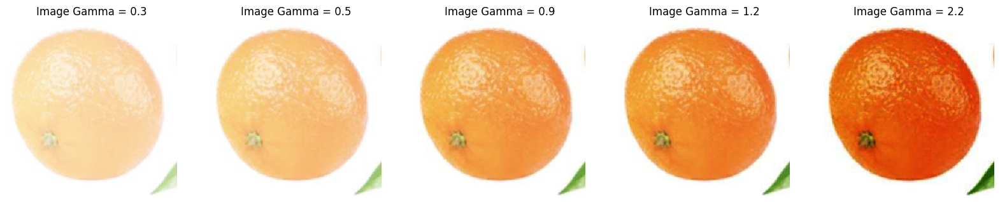

In [72]:
AnImage_Gamma = IntensityTransformation(AnImage, gamma = 0.6, display = 1)

In [73]:
hue = image_hsv[:,:,0]
saturation = image_hsv[:,:,1]
value = image_hsv[:,:,2]

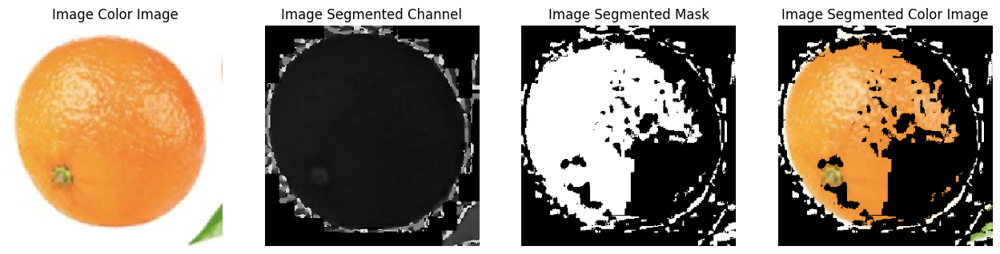

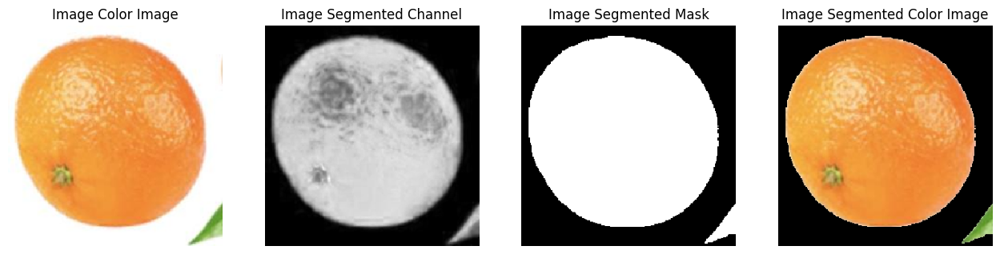

In [74]:
image_mask_bythresh1 = SegmentByThresh(AnImage, hue, segment_range = [14, 45])
image_mask_bythresh2 = SegmentByThresh(AnImage, saturation, segment_range = [70, 255])

Otsu Threshold : 60.0


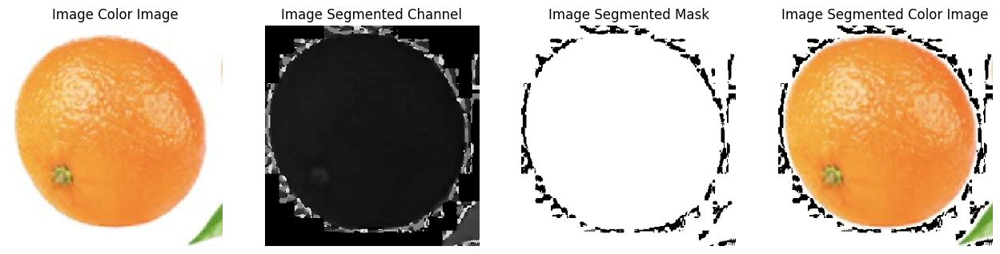

Otsu Threshold : 92.0


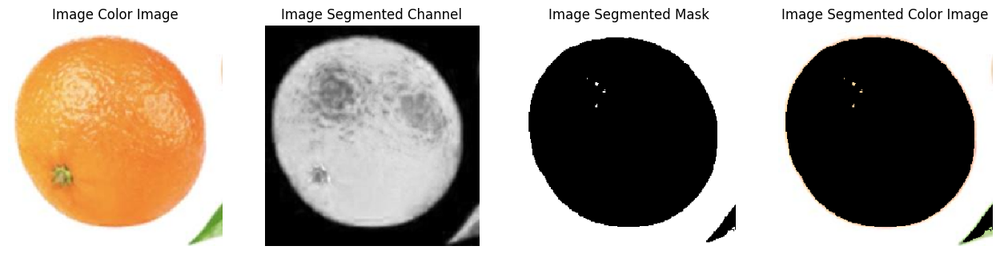

In [75]:
image_mask_byauto1 = SegmentByThresh(AnImage, image_hsv[:,:,0])
image_mask_byauto2 = SegmentByThresh(AnImage, image_hsv[:,:,1])

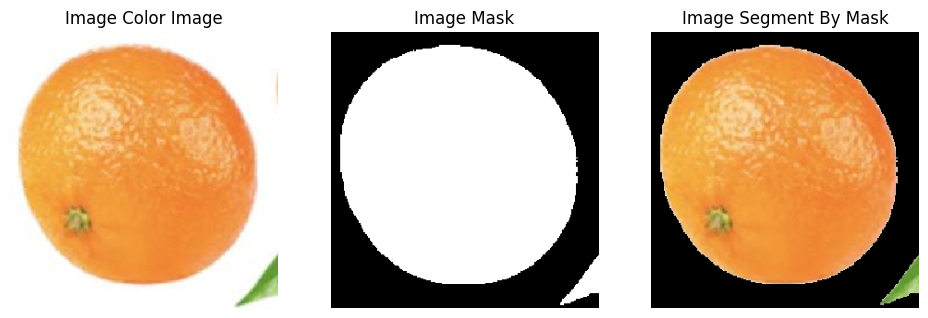

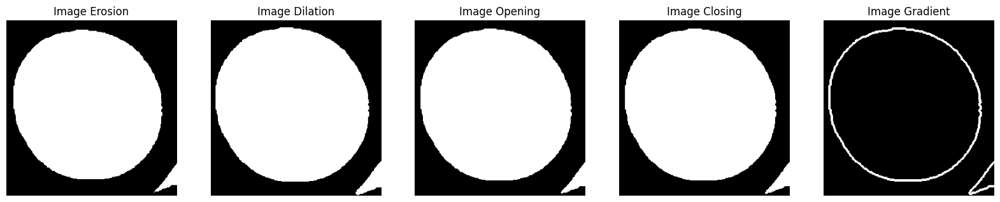

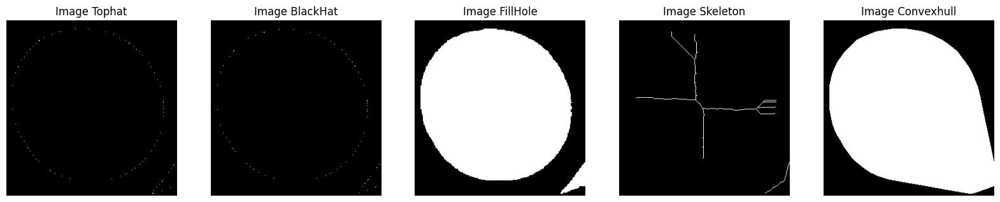

In [76]:
image_mask_bythresh = image_mask_bythresh2.copy()
image_mask_adjust = Morphology(AnImage, image_mask_bythresh, morType = "fillhole", size = 2, display = 1)

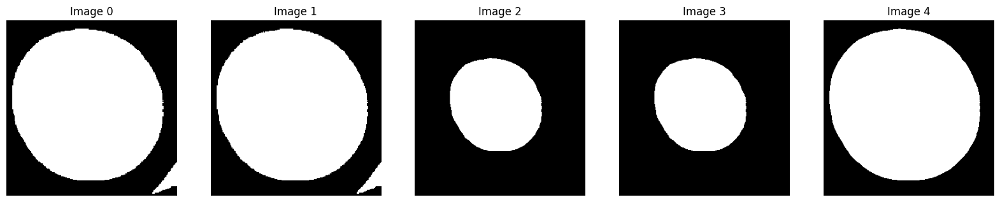

In [77]:
image_mask_adjust = doOrangeMaskSegment2(AnImage, image_mask_bythresh, display = 1)

Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange08_rgbmask.jpg
Oranges (Output)/FreshOrange08_demo.jpg


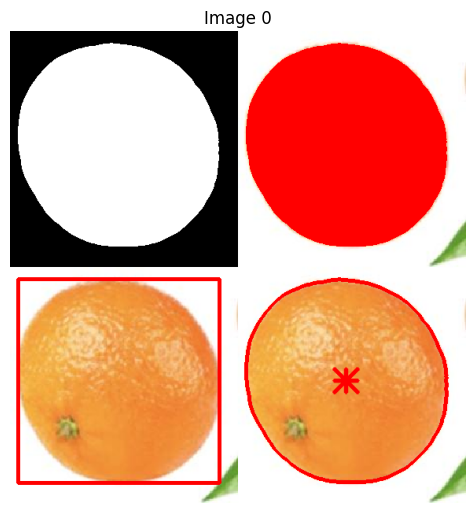

In [78]:
image_mask = image_mask_adjust.copy()
result = GenerateOutput(AnImage, image_mask, FilePath = FileNameList[0], SaveFolderPath = "Oranges (Output)")
(image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary, DemoImage) = result

ShowImage([DemoImage], 1, 3)

## 2/ Thực hiện trích các đặc trưng màu sắc, kích thước, hình dạng v.v… để thành lập 1 table có 2 lớp là fresh và rotten 

================================================================================ Process Image : Orange/FreshOrange01.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange01_rgbmask.jpg
Oranges (Output)/FreshOrange01_demo.jpg


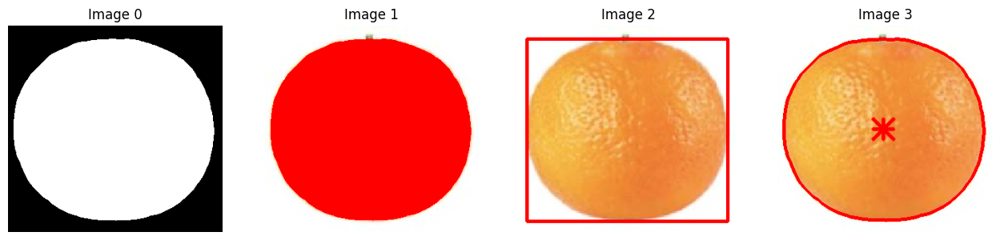

================================================================================ Process Image : Orange/FreshOrange02.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange02_rgbmask.jpg
Oranges (Output)/FreshOrange02_demo.jpg


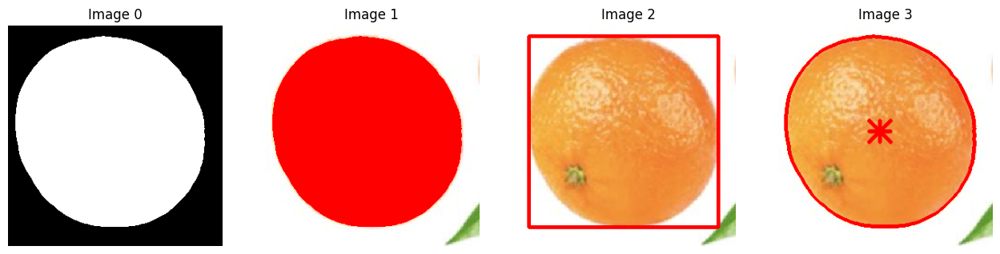

================================================================================ Process Image : Orange/FreshOrange03.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange03_rgbmask.jpg
Oranges (Output)/FreshOrange03_demo.jpg


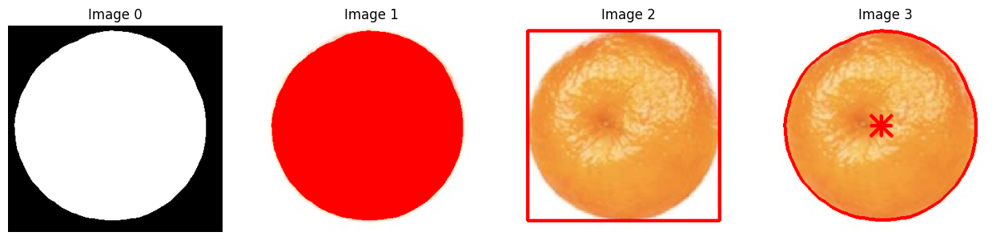

================================================================================ Process Image : Orange/FreshOrange04.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange04_rgbmask.jpg
Oranges (Output)/FreshOrange04_demo.jpg


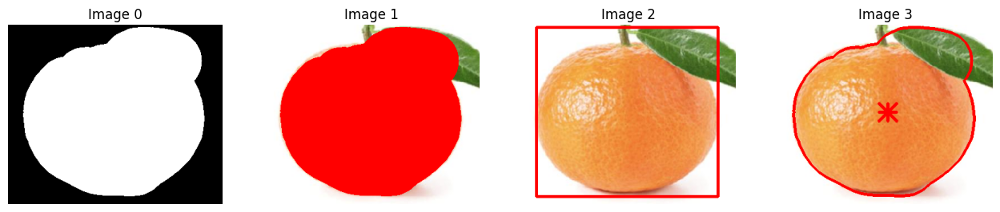

================================================================================ Process Image : Orange/FreshOrange05.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange05_rgbmask.jpg
Oranges (Output)/FreshOrange05_demo.jpg


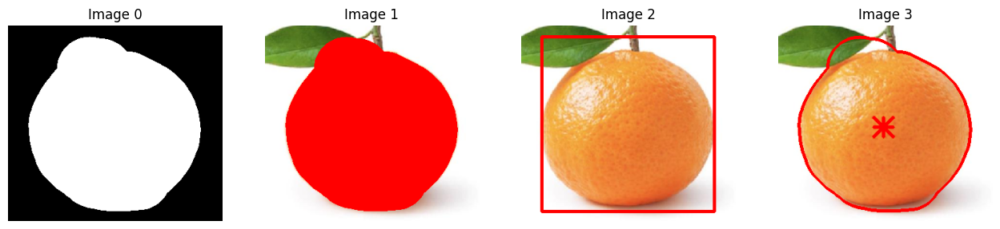

================================================================================ Process Image : Orange/FreshOrange06.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange06_rgbmask.jpg
Oranges (Output)/FreshOrange06_demo.jpg


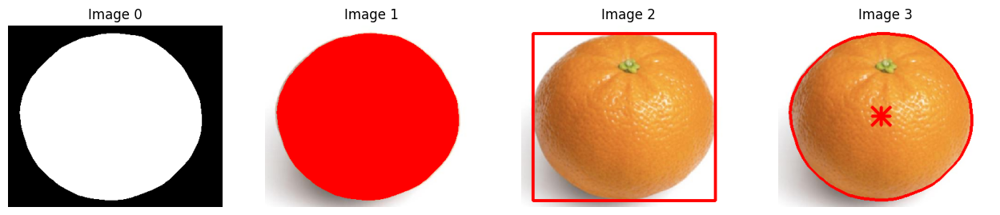

================================================================================ Process Image : Orange/FreshOrange07.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange07_rgbmask.jpg
Oranges (Output)/FreshOrange07_demo.jpg


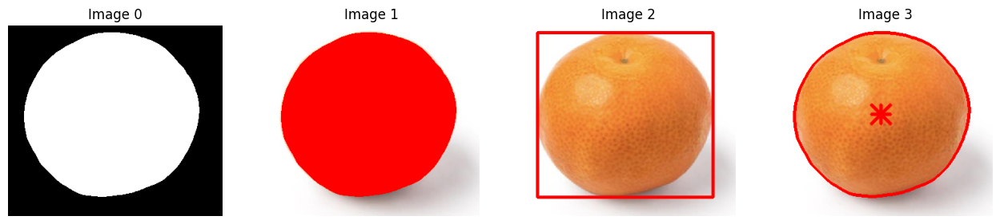

================================================================================ Process Image : Orange/FreshOrange08.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange08_rgbmask.jpg
Oranges (Output)/FreshOrange08_demo.jpg


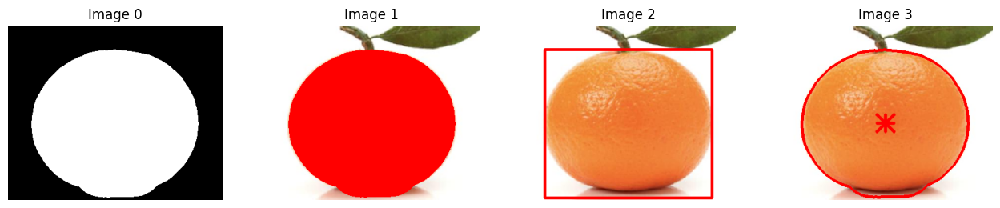

================================================================================ Process Image : Orange/FreshOrange09.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange09_rgbmask.jpg
Oranges (Output)/FreshOrange09_demo.jpg


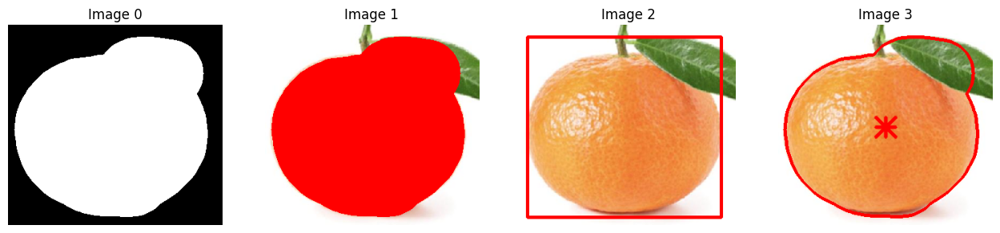

================================================================================ Process Image : Orange/FreshOrange10.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange10_rgbmask.jpg
Oranges (Output)/FreshOrange10_demo.jpg


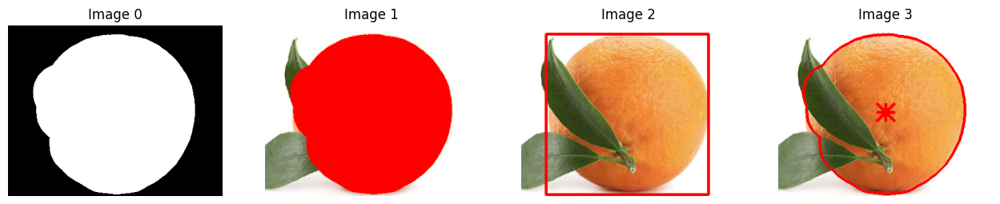

================================================================================ Process Image : Orange/FreshOrange11.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange11_rgbmask.jpg
Oranges (Output)/FreshOrange11_demo.jpg


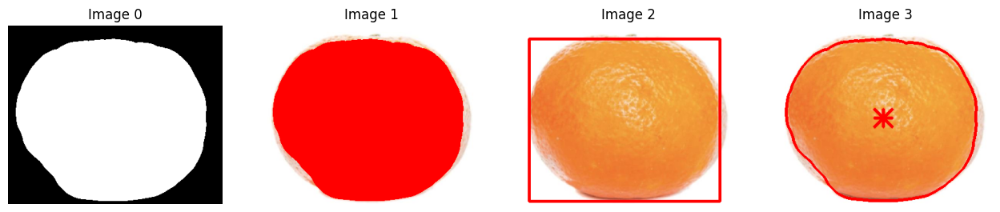

================================================================================ Process Image : Orange/FreshOrange12.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange12_rgbmask.jpg
Oranges (Output)/FreshOrange12_demo.jpg


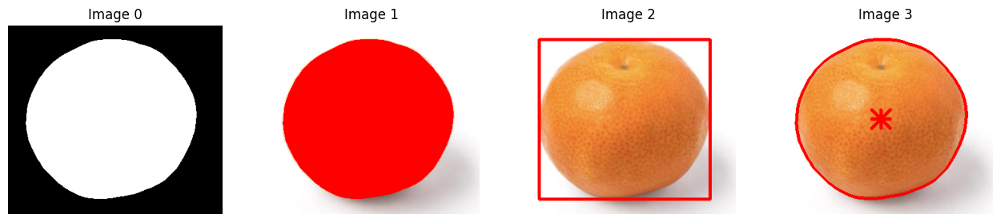

================================================================================ Process Image : Orange/FreshOrange13.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange13_rgbmask.jpg
Oranges (Output)/FreshOrange13_demo.jpg


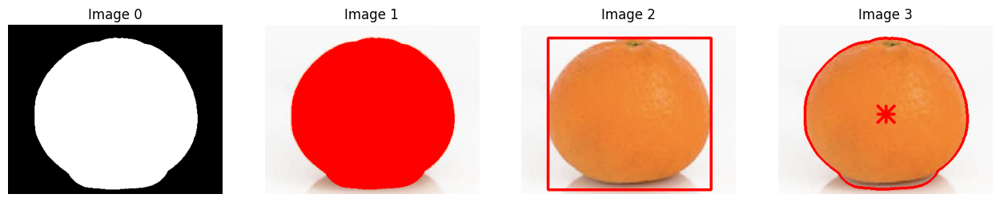

================================================================================ Process Image : Orange/FreshOrange14.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange14_rgbmask.jpg
Oranges (Output)/FreshOrange14_demo.jpg


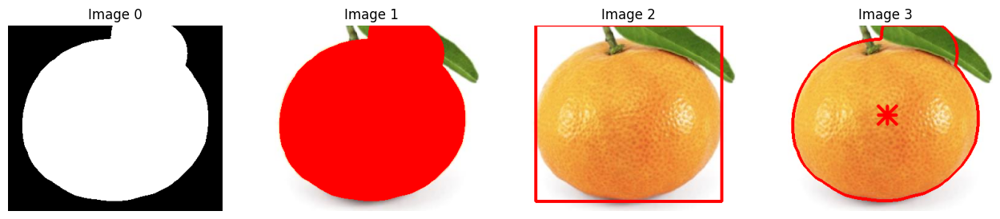

================================================================================ Process Image : Orange/FreshOrange15.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange15_rgbmask.jpg
Oranges (Output)/FreshOrange15_demo.jpg


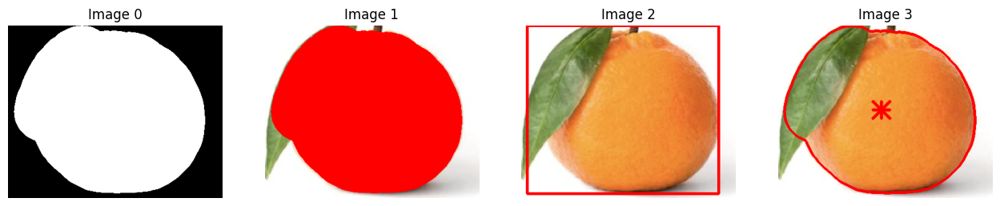

================================================================================ Process Image : Orange/FreshOrange16.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange16_rgbmask.jpg
Oranges (Output)/FreshOrange16_demo.jpg


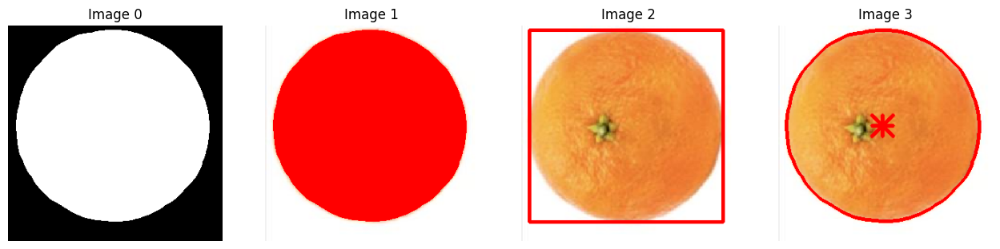

================================================================================ Process Image : Orange/FreshOrange17.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange17_rgbmask.jpg
Oranges (Output)/FreshOrange17_demo.jpg


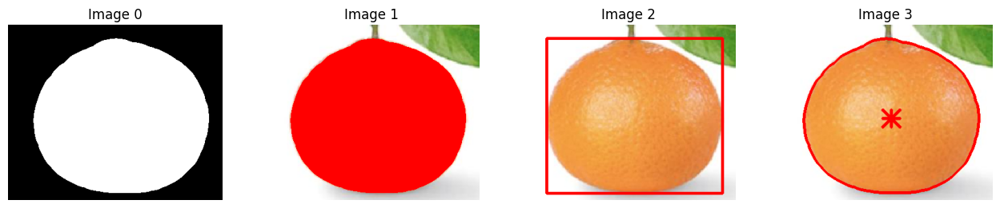

================================================================================ Process Image : Orange/FreshOrange18.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange18_rgbmask.jpg
Oranges (Output)/FreshOrange18_demo.jpg


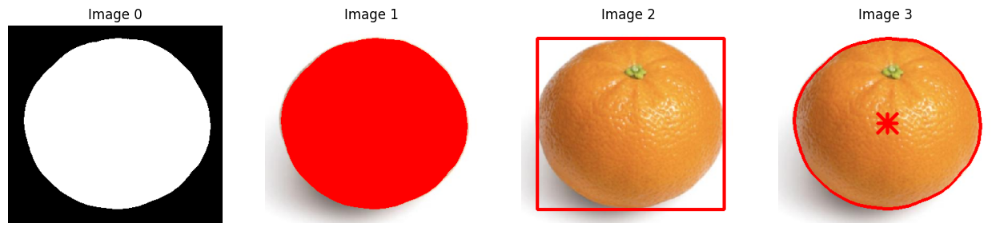

================================================================================ Process Image : Orange/FreshOrange19.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange19_rgbmask.jpg
Oranges (Output)/FreshOrange19_demo.jpg


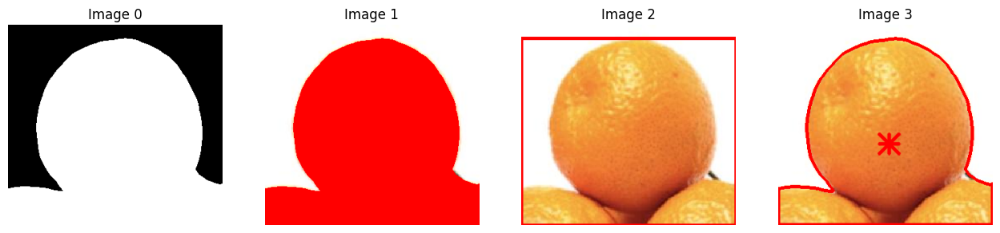

================================================================================ Process Image : Orange/FreshOrange20.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/FreshOrange20_rgbmask.jpg
Oranges (Output)/FreshOrange20_demo.jpg


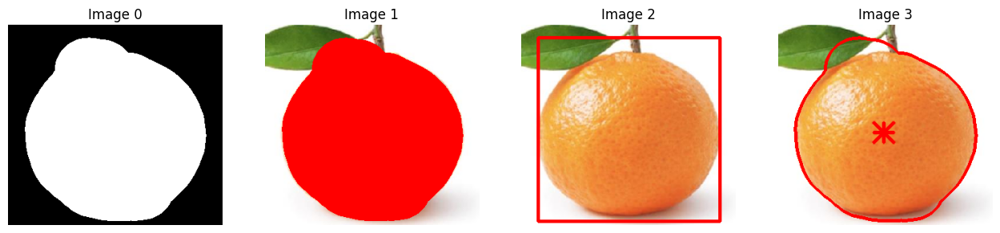

================================================================================ Process Image : Orange/RottenOrange01.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange01_rgbmask.jpg
Oranges (Output)/RottenOrange01_demo.jpg


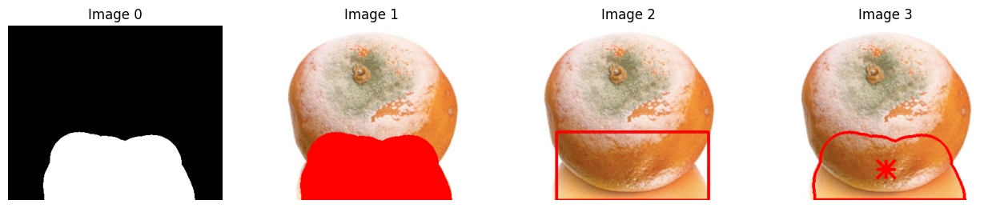

================================================================================ Process Image : Orange/RottenOrange02.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange02_rgbmask.jpg
Oranges (Output)/RottenOrange02_demo.jpg


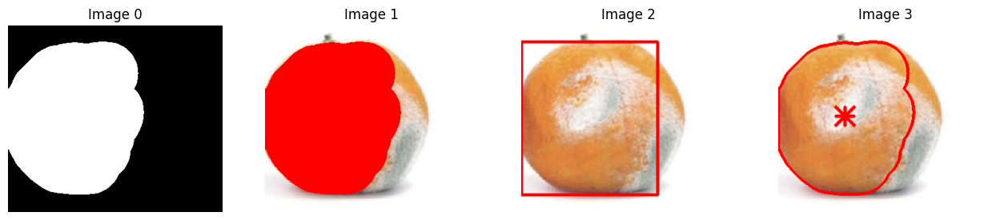

================================================================================ Process Image : Orange/RottenOrange03.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange03_rgbmask.jpg
Oranges (Output)/RottenOrange03_demo.jpg


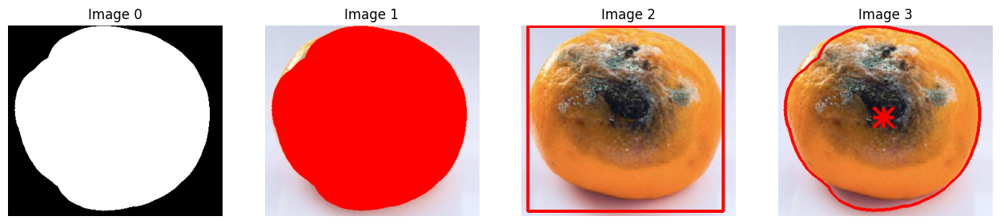

================================================================================ Process Image : Orange/RottenOrange04.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange04_rgbmask.jpg
Oranges (Output)/RottenOrange04_demo.jpg


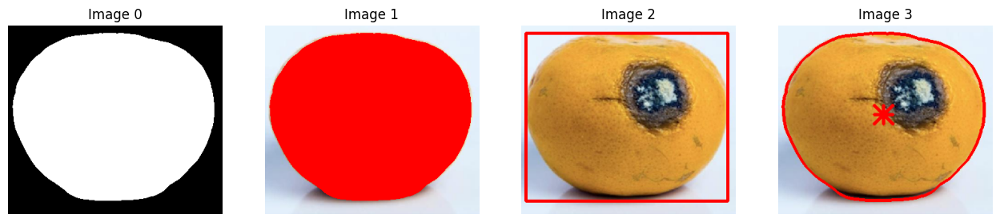

================================================================================ Process Image : Orange/RottenOrange05.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange05_rgbmask.jpg
Oranges (Output)/RottenOrange05_demo.jpg


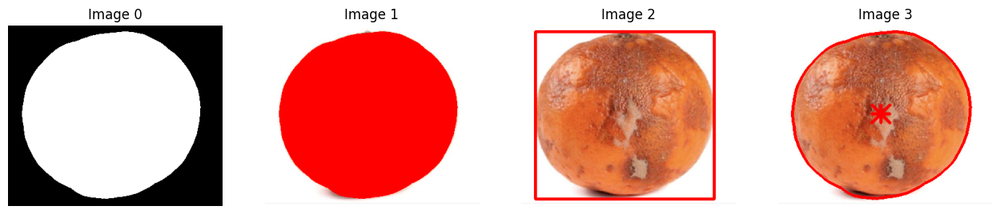

================================================================================ Process Image : Orange/RottenOrange06.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange06_rgbmask.jpg
Oranges (Output)/RottenOrange06_demo.jpg


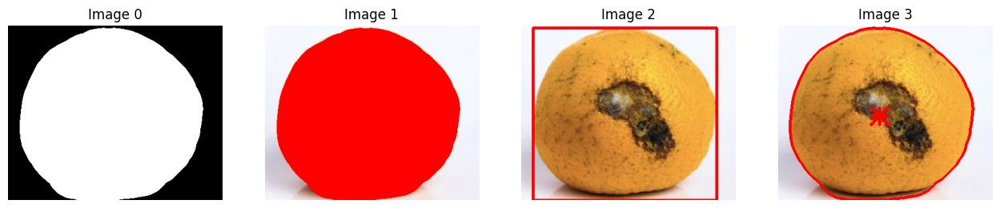

================================================================================ Process Image : Orange/RottenOrange07.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange07_rgbmask.jpg
Oranges (Output)/RottenOrange07_demo.jpg


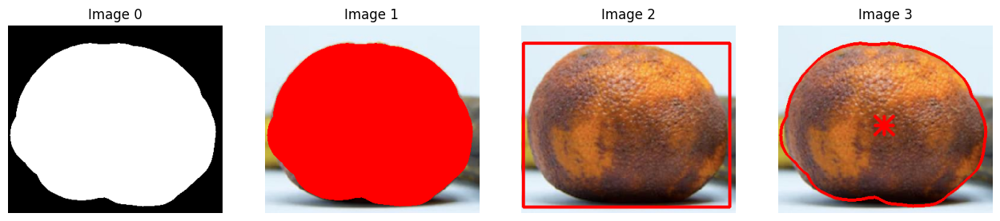

================================================================================ Process Image : Orange/RottenOrange08.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange08_rgbmask.jpg
Oranges (Output)/RottenOrange08_demo.jpg


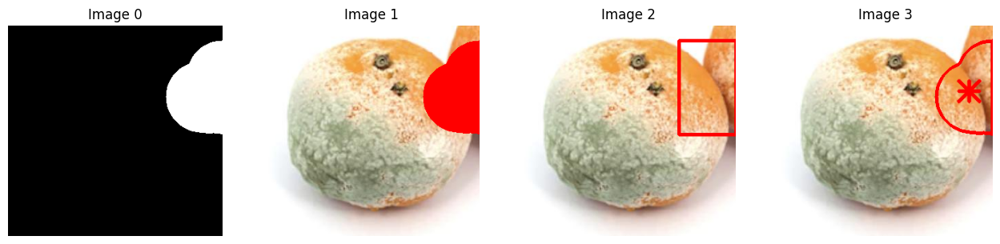

================================================================================ Process Image : Orange/RottenOrange09.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange09_rgbmask.jpg
Oranges (Output)/RottenOrange09_demo.jpg


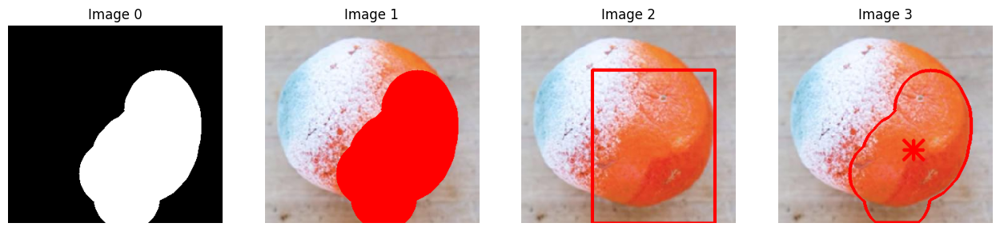

================================================================================ Process Image : Orange/RottenOrange10.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange10_rgbmask.jpg
Oranges (Output)/RottenOrange10_demo.jpg


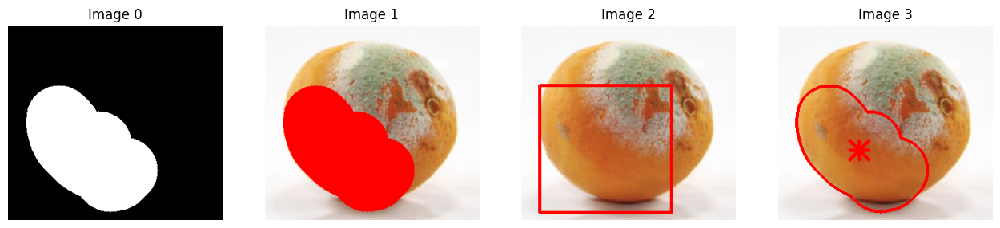

================================================================================ Process Image : Orange/RottenOrange11.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange11_rgbmask.jpg
Oranges (Output)/RottenOrange11_demo.jpg


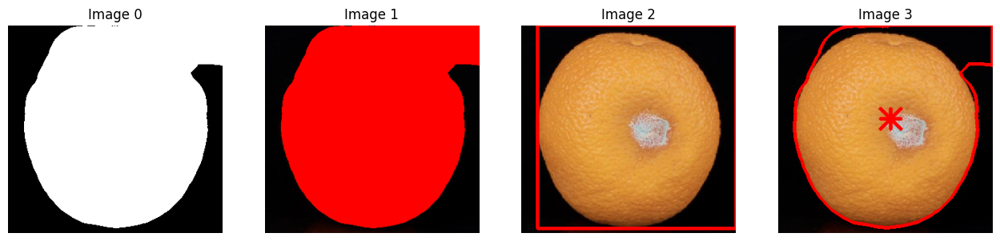

================================================================================ Process Image : Orange/RottenOrange12.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange12_rgbmask.jpg
Oranges (Output)/RottenOrange12_demo.jpg


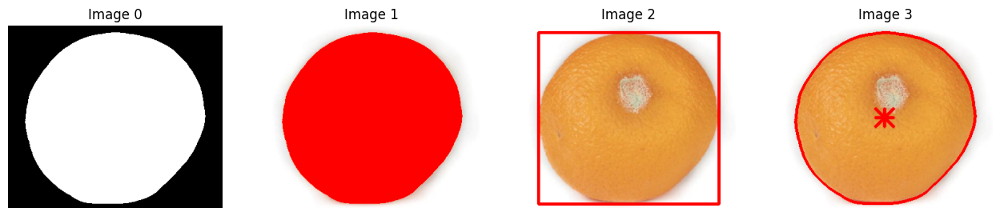

================================================================================ Process Image : Orange/RottenOrange13.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange13_rgbmask.jpg
Oranges (Output)/RottenOrange13_demo.jpg


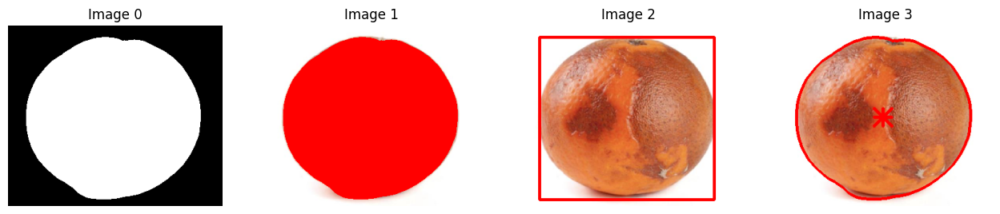

================================================================================ Process Image : Orange/RottenOrange14.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange14_rgbmask.jpg
Oranges (Output)/RottenOrange14_demo.jpg


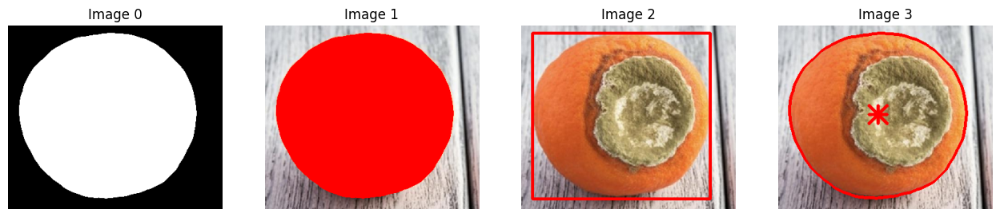

================================================================================ Process Image : Orange/RottenOrange15.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange15_rgbmask.jpg
Oranges (Output)/RottenOrange15_demo.jpg


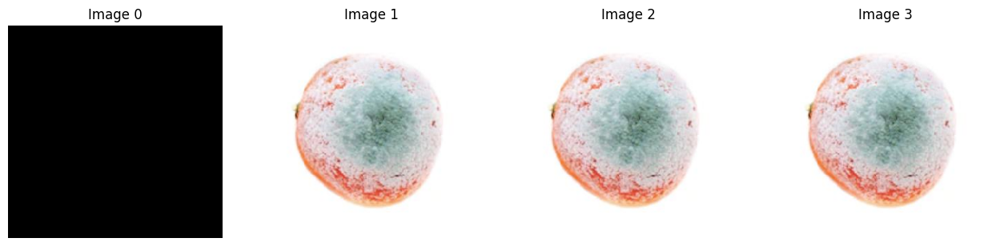

================================================================================ Process Image : Orange/RottenOrange16.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange16_rgbmask.jpg
Oranges (Output)/RottenOrange16_demo.jpg


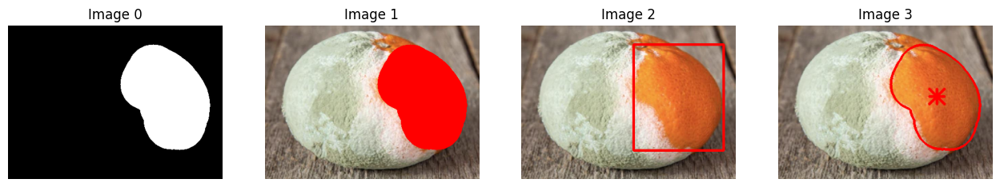

================================================================================ Process Image : Orange/RottenOrange17.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange17_rgbmask.jpg
Oranges (Output)/RottenOrange17_demo.jpg


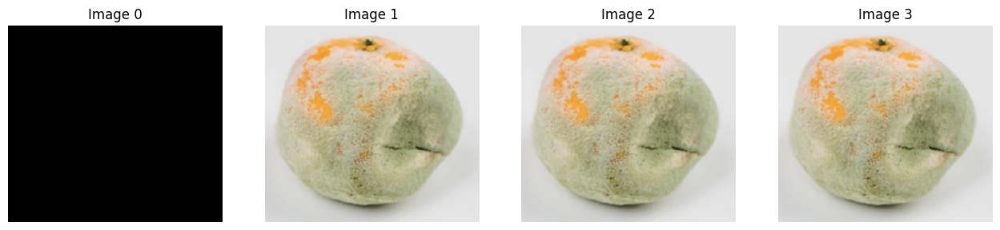

================================================================================ Process Image : Orange/RottenOrange18.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange18_rgbmask.jpg
Oranges (Output)/RottenOrange18_demo.jpg


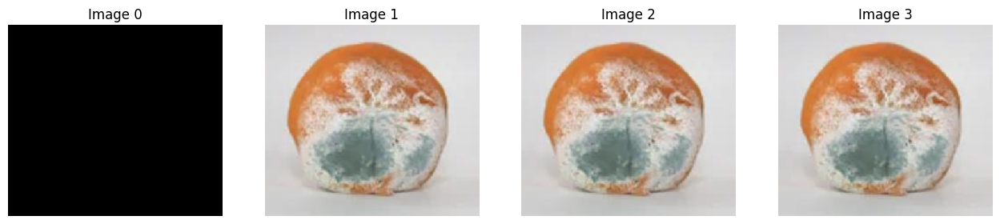

================================================================================ Process Image : Orange/RottenOrange19.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange19_rgbmask.jpg
Oranges (Output)/RottenOrange19_demo.jpg


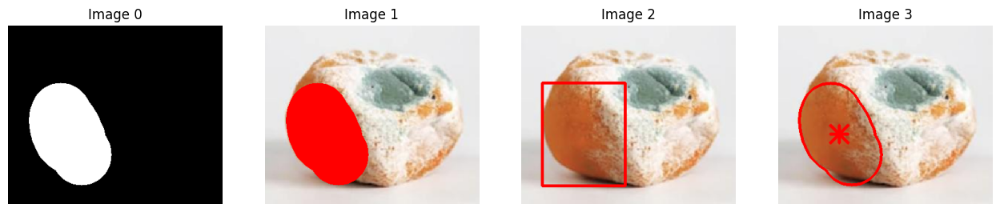

================================================================================ Process Image : Orange/RottenOrange20.jpg
Already Save Results to Folder Oranges (Output)
Oranges (Output)/RottenOrange20_rgbmask.jpg
Oranges (Output)/RottenOrange20_demo.jpg


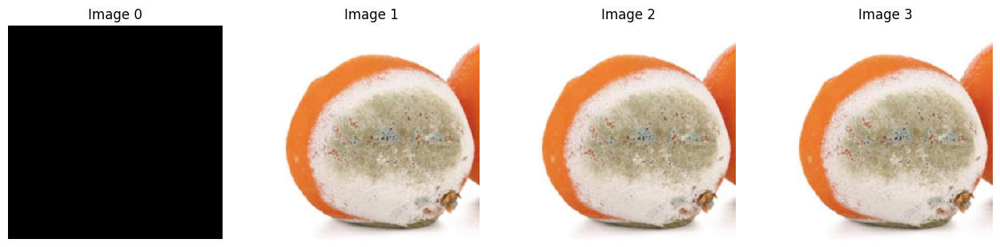

In [79]:
for filepath in DatasetFiles:
  print("=" * 80, f"Process Image : {filepath}")
  AnImage = imread(filepath)
  AnImage = ResizeImage(AnImage, 0, 300)
  image_hsv = ConvertColorSpaces(AnImage, ColorSpace = "HSV", display = 0)

  hue = image_hsv[:,:,0]
  saturation = image_hsv[:,:,1]
  value = image_hsv[:,:,2]
  image_mask_bythresh = SegmentByThresh(AnImage, saturation, segment_range = [70, 255], display = 0)
  image_mask_adjust = doOrangeMaskSegment2(AnImage, image_mask_bythresh, display = 0)
  result = GenerateOutput(AnImage, image_mask_adjust, FilePath = filepath, SaveFolderPath = "Oranges (Output)")
  (image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary, DemoImage) = result

  ShowImage([image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary], 1, 5)

## 3/ Áp dụng 1 thuật toán MLs để học và phân loại giữa trái cam fresh và rotten 

In [80]:
import shutil

FolderPath = "/PERSONAL/courses/Bien_hinh_va_Xu_ly_anh/Object-Transformation-and-Segmentation-Applications/lab/Feature_Extraction"
ConnectToDataFolder(FolderPath)


================================================================================ - Begin: ConnectToDataFolder
List of Data in the Folder :


['20110149.ipynb',
 '21110256_HuynhNguyenTheDan_ IS Lab02.ipynb',
 'archive',
 'Orange']

================================================================================ - Finish: ConnectToDataFolder


In [81]:
# Define paths
path = FolderPath + '/archive/'

input_train_dir = path + 'dataset/train'  # Path to original training data
output_train_dir = path + 'dataset/working/training'
input_test_dir = path + 'dataset/test'
output_test_dir= path + 'dataset/working/test'

# Copy the entire dataset to a location where you have write permissions
shutil.copytree(input_train_dir, output_train_dir)
shutil.copytree(input_test_dir, output_test_dir)

'/PERSONAL/courses/Bien_hinh_va_Xu_ly_anh/Object-Transformation-and-Segmentation-Applications/lab/Feature_Extraction/archive/dataset/working/test'

In [82]:
output_val_dir = path + 'dataset/working/validation'  # Path to working directory for training data
classes = ['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana', 'rottenoranges']  # List of class names
os.makedirs(output_val_dir, exist_ok=True)

# Define the percentage of data to move to validation
validation_percentage = 0.1

In [83]:
# Iterate over each class folder
import random
for class_name in classes:
    class_path = os.path.join(output_train_dir, class_name)
    output_class_path = os.path.join(output_val_dir, class_name)
    os.makedirs(output_class_path, exist_ok=True)

    # List all files in the class folder
    files = os.listdir(class_path)

    # Calculate the number of files to move to validation
    num_validation_files = int(len(files) * validation_percentage)

    # Randomly select files for validation
    validation_files = random.sample(files, num_validation_files)

    # Move selected files to validation list
    for file in validation_files:
        src = os.path.join(class_path, file)
        dst = os.path.join(output_class_path, file)
        shutil.move(src, dst)
print("Validation set created successfully.")

Validation set created successfully.


In [84]:
import torch
import torchvision
from torchvision.datasets import ImageFolder
from shutil import rmtree
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import pathlib
from torch.utils.data import DataLoader
import glob
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from torchvision import models
from torchvision.models import resnet18
from tqdm import tqdm
import os, warnings, cv2
from os.path import isfile, join

# Check GPU is available

device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(device)

cuda


In [85]:
train_path=path + 'dataset/working/training'
test_path=path + 'dataset/working/test'
val_path=path + 'dataset/working/validation'

In [86]:
transform = transforms.Compose(
    [transforms.Resize((128,128)),transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [87]:
root=pathlib.Path(train_path)
classes=sorted([j.name.split('/')[-1] for j in root.iterdir()])
print(classes)

['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana', 'rottenoranges']


In [88]:
train_count=len(glob.glob(train_path+'/**/*.png'))
test_count=len(glob.glob(test_path+'/**/*.png'))
val_count=len(glob.glob(val_path+'/**/*.png'))
print(train_count,test_count,val_count)

9813 2698 1088


### Creating DataLoaders

In [89]:
batch_size = 16

In [90]:
train_loader=DataLoader(
    torchvision.datasets.ImageFolder(train_path,transform=transform),
    batch_size=batch_size, shuffle=True
)

val_loader=DataLoader(
    torchvision.datasets.ImageFolder(val_path,transform=transform),
    batch_size=batch_size, shuffle=True
)

test_loader=DataLoader(
    torchvision.datasets.ImageFolder(test_path,transform=transform),
    batch_size=batch_size, shuffle=True
)

In [91]:
model = models.resnet18(pretrained=True)
model.eval()

c:\Users\theda\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\theda\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [92]:
optimizer=torch.optim.Adam(model.parameters(),lr=0.001,weight_decay=0.0001)
loss_function=nn.CrossEntropyLoss()

In [93]:
num_epochs = 25

In [94]:
device = torch.device('cuda')  # specify the device (GPU)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Training Started
Epoch 1/25


Epoch 1/25 - Training: 100%|██████████| 614/614 [02:30<00:00,  4.07it/s, loss=0.261, accuracy=88.4]  


Train Accuracy: 88.36%


Epoch 1/25 - Validation: 100%|██████████| 68/68 [00:15<00:00,  4.34it/s, loss=0.261, accuracy=86.7]


Validation Accuracy: 86.67%
Epoch 2/25


Epoch 2/25 - Training: 100%|██████████| 614/614 [01:20<00:00,  7.67it/s, loss=0.0107, accuracy=94.5] 


Train Accuracy: 94.50%


Epoch 2/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  8.75it/s, loss=0.0107, accuracy=96.2]


Validation Accuracy: 96.23%
Epoch 3/25


Epoch 3/25 - Training: 100%|██████████| 614/614 [01:24<00:00,  7.26it/s, loss=0.747, accuracy=95.6]  


Train Accuracy: 95.56%


Epoch 3/25 - Validation: 100%|██████████| 68/68 [00:09<00:00,  7.46it/s, loss=0.747, accuracy=96.2]


Validation Accuracy: 96.23%
Epoch 4/25


Epoch 4/25 - Training: 100%|██████████| 614/614 [01:28<00:00,  6.97it/s, loss=0.0235, accuracy=96.1]  


Train Accuracy: 96.12%


Epoch 4/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.38it/s, loss=0.0235, accuracy=98.7]


Validation Accuracy: 98.71%
Epoch 5/25


Epoch 5/25 - Training: 100%|██████████| 614/614 [01:17<00:00,  7.89it/s, loss=0.161, accuracy=96.3]  


Train Accuracy: 96.30%


Epoch 5/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.12it/s, loss=0.161, accuracy=97.9]


Validation Accuracy: 97.89%
Epoch 6/25


Epoch 6/25 - Training: 100%|██████████| 614/614 [01:11<00:00,  8.55it/s, loss=0.0125, accuracy=97.6]  


Train Accuracy: 97.58%


Epoch 6/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 10.29it/s, loss=0.0125, accuracy=97.8]


Validation Accuracy: 97.79%
Epoch 7/25


Epoch 7/25 - Training: 100%|██████████| 614/614 [01:11<00:00,  8.60it/s, loss=0.0103, accuracy=97]    


Train Accuracy: 96.99%


Epoch 7/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 10.22it/s, loss=0.0103, accuracy=97.3]


Validation Accuracy: 97.33%
Epoch 8/25


Epoch 8/25 - Training: 100%|██████████| 614/614 [01:13<00:00,  8.37it/s, loss=0.00609, accuracy=96.9] 


Train Accuracy: 96.94%


Epoch 8/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  9.23it/s, loss=0.00609, accuracy=97.1]


Validation Accuracy: 97.06%
Epoch 9/25


Epoch 9/25 - Training: 100%|██████████| 614/614 [01:16<00:00,  8.07it/s, loss=0.0257, accuracy=97.7]  


Train Accuracy: 97.69%


Epoch 9/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.22it/s, loss=0.0257, accuracy=97.7]


Validation Accuracy: 97.70%
Epoch 10/25


Epoch 10/25 - Training: 100%|██████████| 614/614 [01:20<00:00,  7.64it/s, loss=0.104, accuracy=97.5]   


Train Accuracy: 97.50%


Epoch 10/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.09it/s, loss=0.104, accuracy=98.1]


Validation Accuracy: 98.07%
Epoch 11/25


Epoch 11/25 - Training: 100%|██████████| 614/614 [01:22<00:00,  7.46it/s, loss=0.0314, accuracy=97.7]  


Train Accuracy: 97.74%


Epoch 11/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  9.31it/s, loss=0.0314, accuracy=97.9]


Validation Accuracy: 97.89%
Epoch 12/25


Epoch 12/25 - Training: 100%|██████████| 614/614 [01:15<00:00,  8.15it/s, loss=0.01, accuracy=98.2]    


Train Accuracy: 98.21%


Epoch 12/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  9.34it/s, loss=0.01, accuracy=96.9]


Validation Accuracy: 96.88%
Epoch 13/25


Epoch 13/25 - Training: 100%|██████████| 614/614 [01:14<00:00,  8.20it/s, loss=0.00183, accuracy=98.1] 


Train Accuracy: 98.12%


Epoch 13/25 - Validation: 100%|██████████| 68/68 [00:06<00:00,  9.72it/s, loss=0.00183, accuracy=98.3]


Validation Accuracy: 98.25%
Epoch 14/25


Epoch 14/25 - Training: 100%|██████████| 614/614 [01:12<00:00,  8.45it/s, loss=0.797, accuracy=98.2]   


Train Accuracy: 98.16%


Epoch 14/25 - Validation: 100%|██████████| 68/68 [00:06<00:00,  9.74it/s, loss=0.797, accuracy=95.3]


Validation Accuracy: 95.31%
Epoch 15/25


Epoch 15/25 - Training: 100%|██████████| 614/614 [01:18<00:00,  7.85it/s, loss=0.0122, accuracy=98.3]  


Train Accuracy: 98.26%


Epoch 15/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 10.33it/s, loss=0.0122, accuracy=97.2]


Validation Accuracy: 97.24%
Epoch 16/25


Epoch 16/25 - Training: 100%|██████████| 614/614 [01:10<00:00,  8.77it/s, loss=0.63, accuracy=98.4]    


Train Accuracy: 98.37%


Epoch 16/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 11.23it/s, loss=0.63, accuracy=97.7]


Validation Accuracy: 97.70%
Epoch 17/25


Epoch 17/25 - Training: 100%|██████████| 614/614 [01:08<00:00,  8.92it/s, loss=0.368, accuracy=98.7]   


Train Accuracy: 98.69%


Epoch 17/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  9.64it/s, loss=0.368, accuracy=98.5]


Validation Accuracy: 98.53%
Epoch 18/25


Epoch 18/25 - Training: 100%|██████████| 614/614 [01:21<00:00,  7.56it/s, loss=0.0131, accuracy=98.6]  


Train Accuracy: 98.62%


Epoch 18/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.29it/s, loss=0.0131, accuracy=97.8]


Validation Accuracy: 97.79%
Epoch 19/25


Epoch 19/25 - Training: 100%|██████████| 614/614 [01:22<00:00,  7.48it/s, loss=0.738, accuracy=98.8]   


Train Accuracy: 98.77%


Epoch 19/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.01it/s, loss=0.738, accuracy=97.6]


Validation Accuracy: 97.61%
Epoch 20/25


Epoch 20/25 - Training: 100%|██████████| 614/614 [01:20<00:00,  7.60it/s, loss=0.00248, accuracy=99]   


Train Accuracy: 99.01%


Epoch 20/25 - Validation: 100%|██████████| 68/68 [00:08<00:00,  8.23it/s, loss=0.00248, accuracy=98.2]


Validation Accuracy: 98.16%
Epoch 21/25


Epoch 21/25 - Training: 100%|██████████| 614/614 [01:19<00:00,  7.68it/s, loss=0.137, accuracy=99]     


Train Accuracy: 99.00%


Epoch 21/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  8.93it/s, loss=0.137, accuracy=99.1]


Validation Accuracy: 99.08%
Epoch 22/25


Epoch 22/25 - Training: 100%|██████████| 614/614 [01:16<00:00,  8.03it/s, loss=0.0139, accuracy=98.4]  


Train Accuracy: 98.44%


Epoch 22/25 - Validation: 100%|██████████| 68/68 [00:07<00:00,  9.53it/s, loss=0.0139, accuracy=98.3]


Validation Accuracy: 98.35%
Epoch 23/25


Epoch 23/25 - Training: 100%|██████████| 614/614 [01:14<00:00,  8.27it/s, loss=0.00104, accuracy=99.1] 


Train Accuracy: 99.07%


Epoch 23/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 10.02it/s, loss=0.00104, accuracy=99.7]


Validation Accuracy: 99.72%
Epoch 24/25


Epoch 24/25 - Training: 100%|██████████| 614/614 [01:12<00:00,  8.41it/s, loss=0.00468, accuracy=98.9] 


Train Accuracy: 98.93%


Epoch 24/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 10.55it/s, loss=0.00468, accuracy=98.6]


Validation Accuracy: 98.62%
Epoch 25/25


Epoch 25/25 - Training: 100%|██████████| 614/614 [01:10<00:00,  8.72it/s, loss=1.07, accuracy=98.9]    


Train Accuracy: 98.91%


Epoch 25/25 - Validation: 100%|██████████| 68/68 [00:06<00:00, 10.57it/s, loss=1.07, accuracy=97.4]


Validation Accuracy: 97.43%
Finished Training


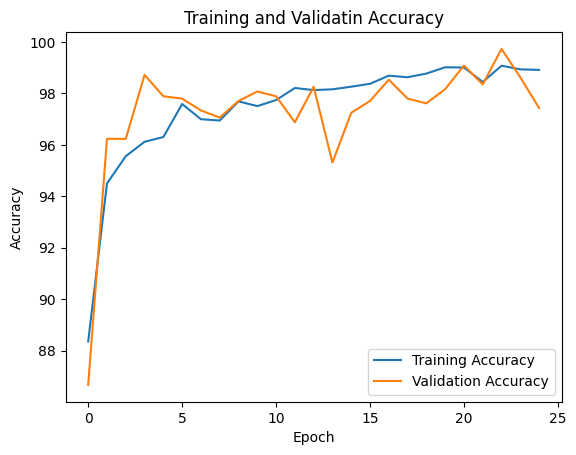

In [95]:
train_acc_list = []
val_acc_list = []

print("Training Started")

for epoch in range(num_epochs):

    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    print(f"Epoch {epoch+1}/{num_epochs}")
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training")
    for i, data in enumerate(train_bar, 0):

        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)  # move inputs and labels to the GPU

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()

        # Track training accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        train_bar.set_postfix({'loss': loss.item(), 'accuracy': 100 * correct / total})

        running_loss += loss.item()
        if i % 10000 == 9999:    # print every 10,000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 10000))
            running_loss = 0.0

    # Print training accuracy
    train_acc = 100 * correct / total
    print(f"Train Accuracy: {train_acc:.2f}%")
    train_acc_list.append(train_acc)

    # Evaluate on Validation set
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation")
        for data in val_bar:

            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)  # move inputs and labels to the GPU

            outputs = model(inputs)
            val_loss += loss_function(outputs, labels).item()

            # Track Validation accuracy
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            val_bar.set_postfix({'loss': loss.item(), 'accuracy': 100 * val_correct / val_total})

    # Print Val accuracy
    val_acc = 100 * val_correct / val_total
    print(f"Validation Accuracy: {val_acc:.2f}%")
    val_acc_list.append(val_acc)

print('Finished Training')

# Plot the final training and validaton accuracy
plt.plot(train_acc_list, label='Training Accuracy')
plt.plot(val_acc_list, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validatin Accuracy')
plt.legend()
plt.show()

In [96]:
# Save the trained model
torch.save(model.state_dict(), 'resnet18fruit_V001.pth')

### Accuracy on Testing Set

In [97]:
train_accuracy = train_acc_list

# Get the overall accuracy (final accuracy after training)
overall_train_accuracy = train_accuracy[-1]

# Print the overall accuracy
print(f"Overall Training Accuracy: {overall_train_accuracy:.4f}")

Overall Training Accuracy: 98.9096


In [98]:
model.eval()
test_total = []
test_pred = []

with torch.no_grad():

    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        test_total.extend(labels.cpu().numpy())
        test_pred.extend(predicted.cpu().numpy())

# Calculate the F1 score
f1 = f1_score(test_total, test_pred, average='weighted')
print(f'F1 score: {f1:.4f}')

# Calculate the confusion matrix
cm = confusion_matrix(test_total, test_pred)
print('Confusion matrix:')
print(cm)

F1 score: 0.9691
Confusion matrix:
[[395   0   0   0   0   0]
 [  0 368   0   0  13   0]
 [  1   0 385   0   0   2]
 [ 17   0   6 540   0  38]
 [  0   0   0   0 530   0]
 [  0   0   4   2   0 397]]


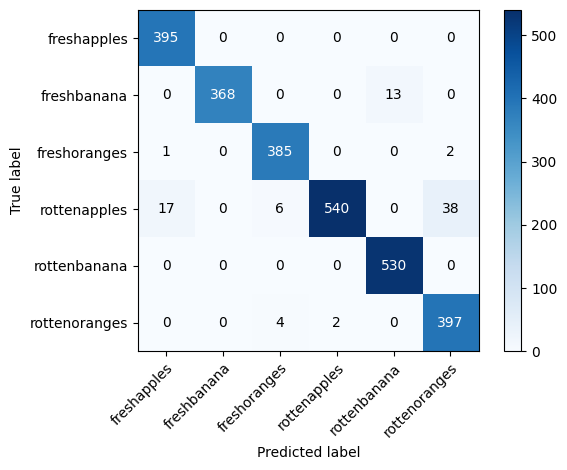

In [99]:
# Plot the confusion matrix
fig, ax = plt.subplots()
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       xticklabels=classes, yticklabels=classes,
       ylabel='True label',
       xlabel='Predicted label')
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
fmt = 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout()
plt.show()